In [20]:
import pandas as pd
from database import stock_data
import plotly.express as px
import matplotlib.pyplot as plt
tickers = ["AAPL","META","TSLA","GOOG"]

In [21]:
def bollinger_bands(df, n, m):
    # takes dataframe on input
    # n = smoothing length
    # m = number of standard deviations away from MA
    
    #typical price
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    # but we will use Adj close instead for now, depends
    
    data = TP
    #data = df['Adj Close']
    
    # takes one column from dataframe
    B_MA = pd.Series((data.rolling(n, min_periods=n).mean()), name='B_MA')
    sigma = data.rolling(n, min_periods=n).std() 
    
    BU = pd.Series((B_MA + m * sigma), name='BU')
    BL = pd.Series((B_MA - m * sigma), name='BL')
    
    df = df.join(B_MA)
    df = df.join(BU)
    df = df.join(BL)
    
    return df

In [22]:
def add_info(df):
    df = bollinger_bands(df,14 # days
                         ,2) #std
    
    df['SMA20'] = df['Close'].rolling(20).mean()
    
    df['SMA50'] = df['Close'].rolling(50).mean()
    
    df['SMA200'] = df['Close'].rolling(200).mean()
    
    df["daily_returns"] = df['Close'].pct_change()
    
    return df

In [23]:
def stock_more_info(ticker):
    df = stock_data().read_table(ticker)

    df = add_info(df)

    print("moving averages 20/50/200")
    fig = px.line(df, x=df.index, y=df['Close'])
    fig.add_scatter(x=df.index, y=df['SMA20'])
    fig.add_scatter(x=df.index, y=df['SMA50'])
    fig.add_scatter(x=df.index, y=df['SMA200'])
    fig.show()

    print("the last 200 days")
    df['Close'].iloc[-200:].plot()
    df['SMA20'].iloc[-200:].plot()
    df['SMA50'].iloc[-200:].plot()
    df['SMA200'].iloc[-200:].plot()

    plt.xticks(rotation=45)
    plt.legend()
    plt.show();

    print("bollinger bands")
    fig = px.line(df, x=df.index, y=df['Close'])
    fig.add_scatter(x=df.index, y=df['BU'])
    fig.add_scatter(x=df.index, y=df['BL'])
    fig.show()

    print("the last 200 days")
    df['Close'].iloc[-200:].plot()
    df['BU'].iloc[-200:].plot()
    df['B_MA'].iloc[-200:].plot()
    df['BL'].iloc[-200:].plot()
    plt.xticks(rotation=45)

    plt.legend()
    plt.show();

    print("returns ::")
    fig = px.line(data_frame=df,x=df.index,y=abs(df["daily_returns"]))
    fig.show()

AAPL shape  (10737, 6)
moving averages 20/50/200


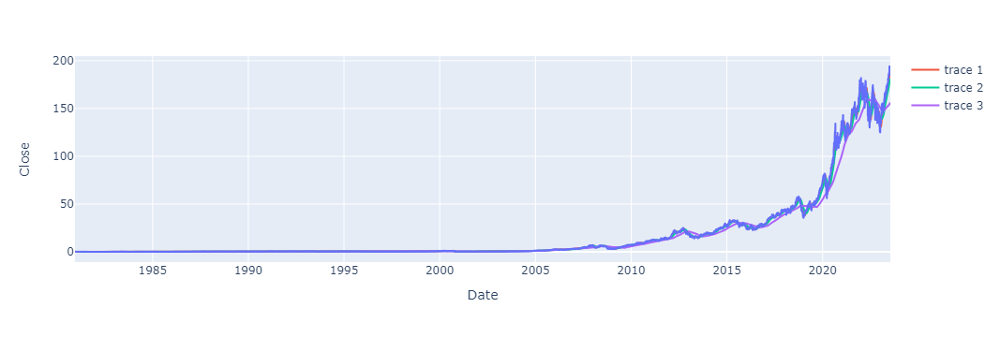

the last 200 days


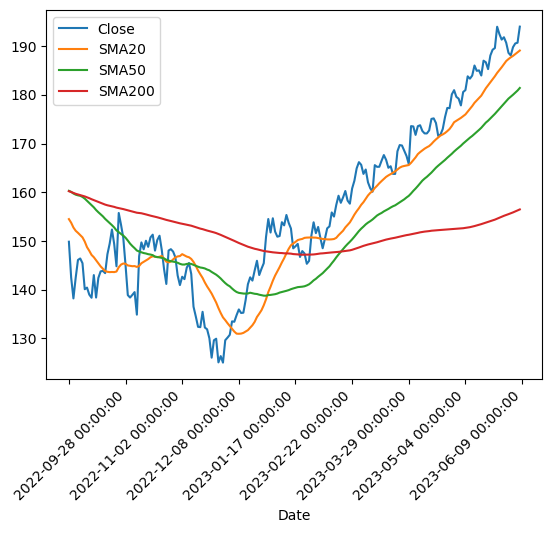

bollinger bands


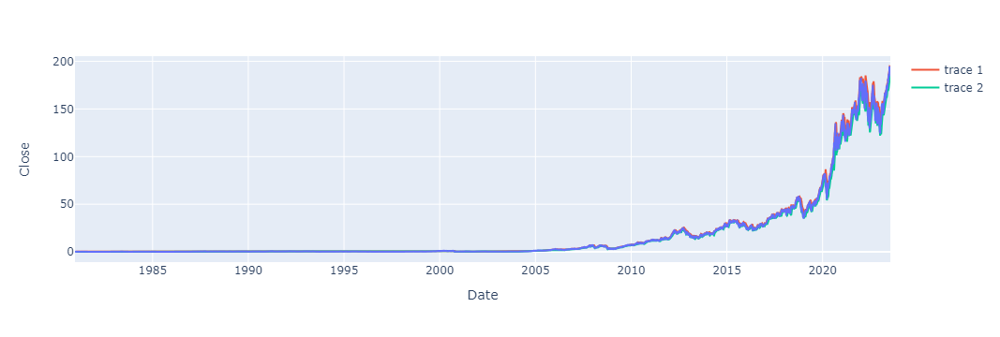

the last 200 days


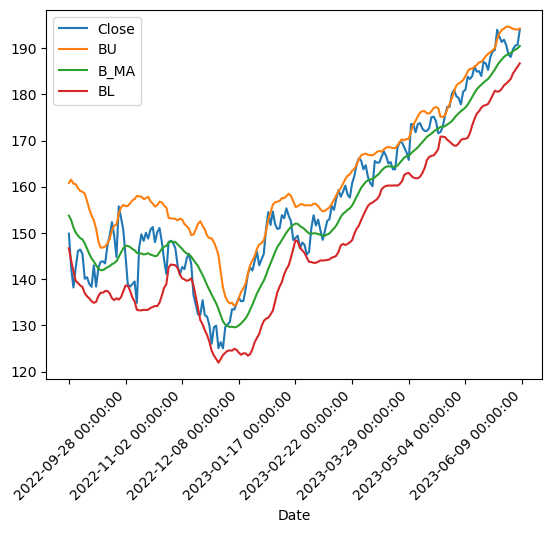

returns ::


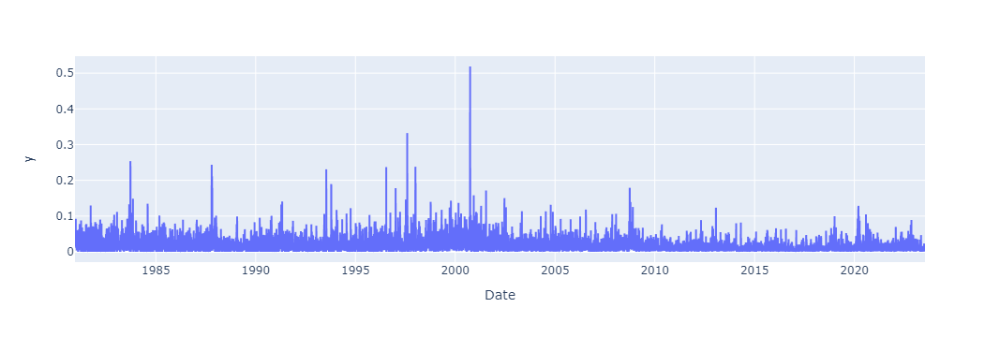

META shape  (2807, 6)
moving averages 20/50/200


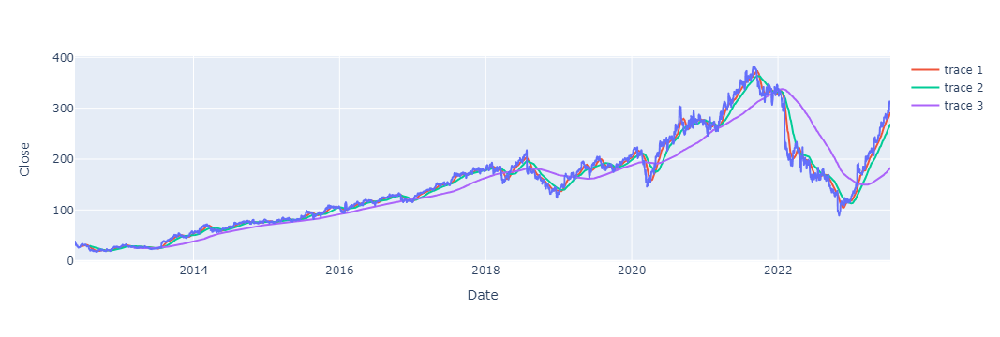

the last 200 days


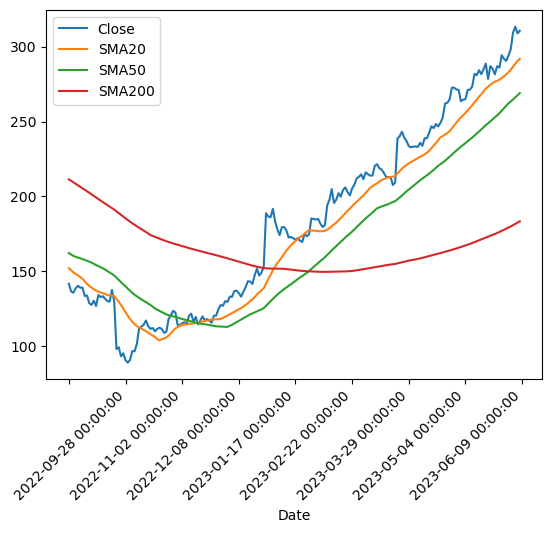

bollinger bands


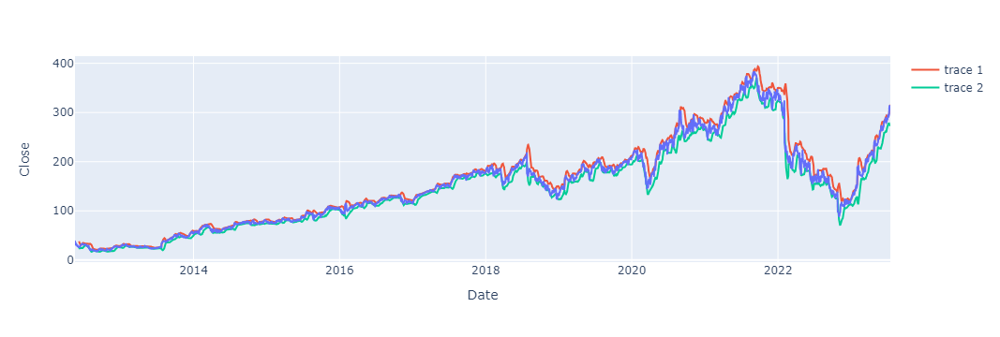

the last 200 days


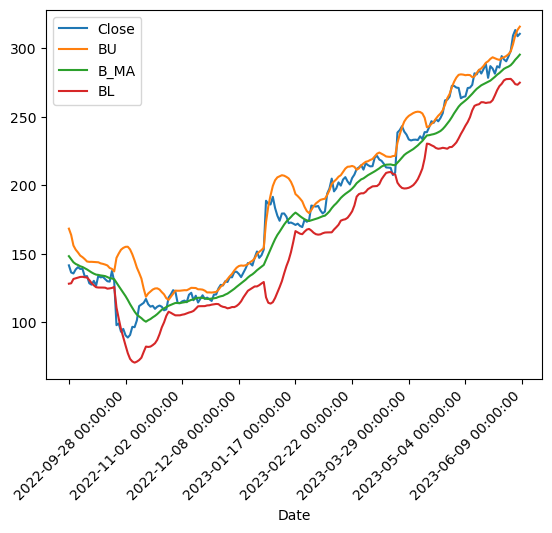

returns ::


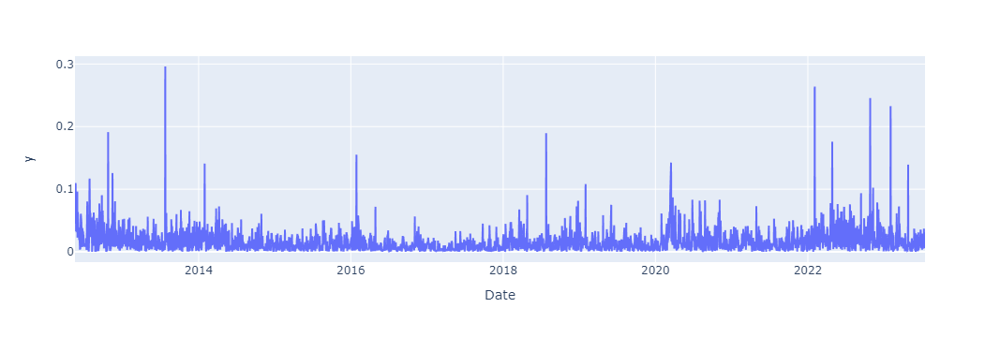

TSLA shape  (3284, 6)
moving averages 20/50/200


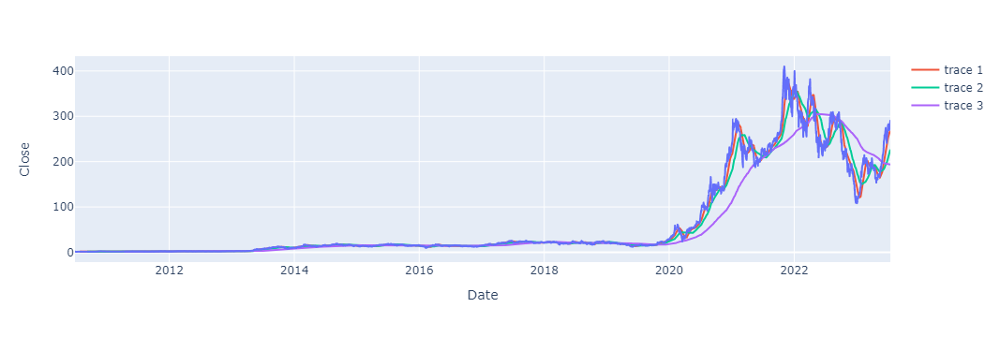

the last 200 days


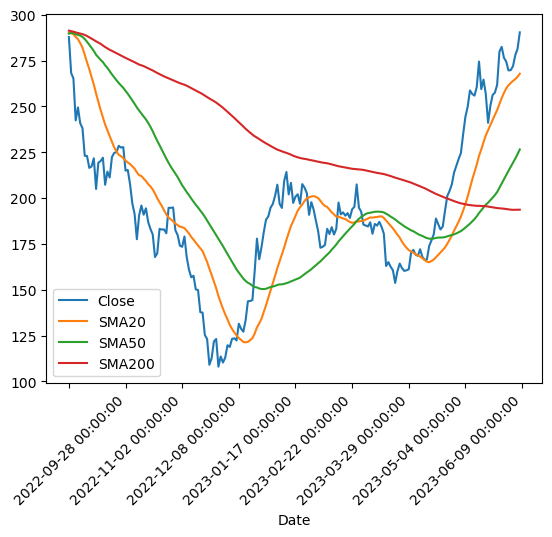

bollinger bands


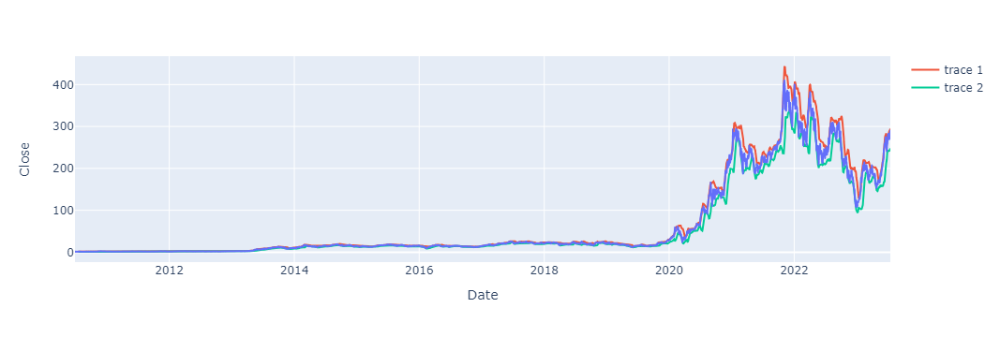

the last 200 days


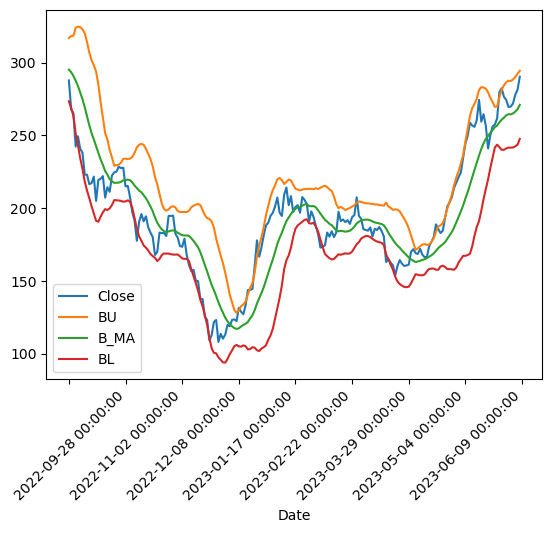

returns ::


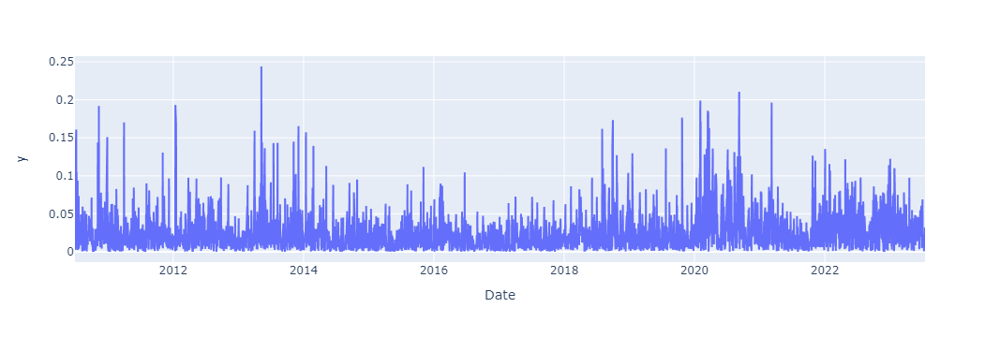

GOOG shape  (4759, 6)
moving averages 20/50/200


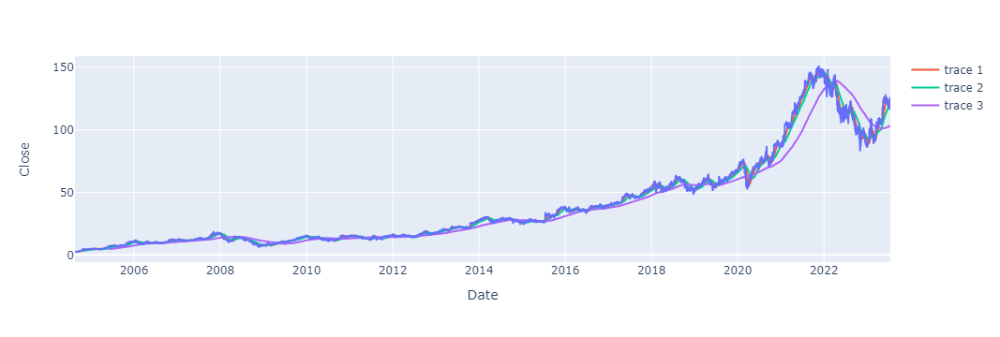

the last 200 days


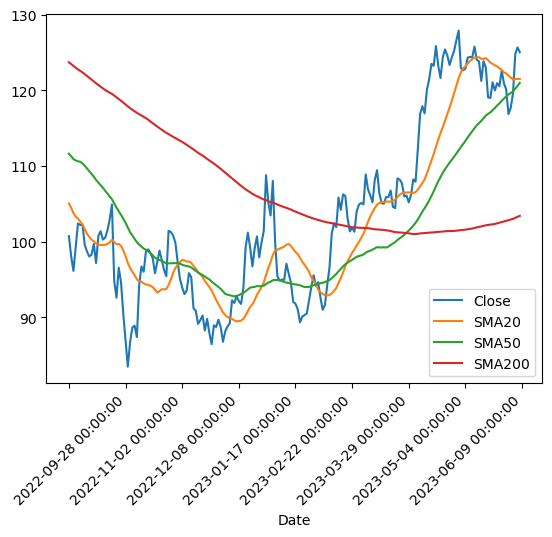

bollinger bands


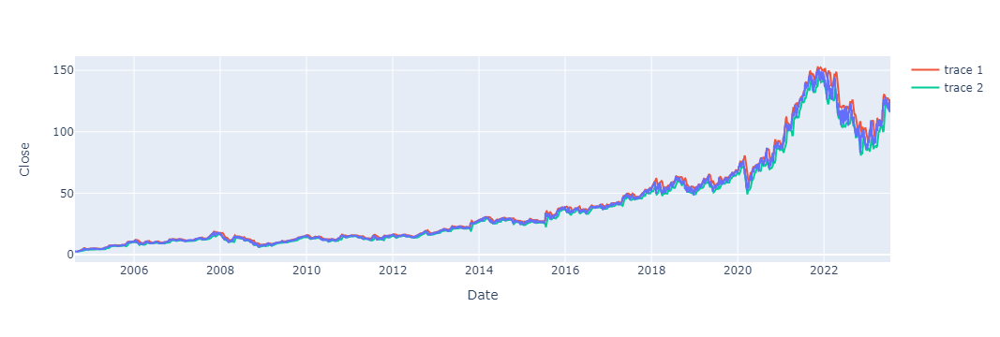

the last 200 days


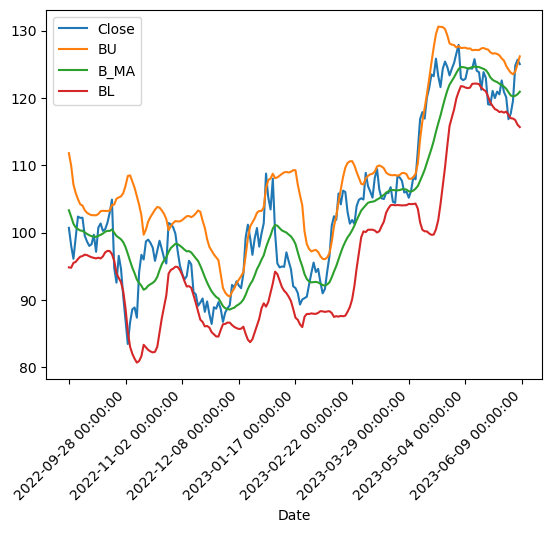

returns ::


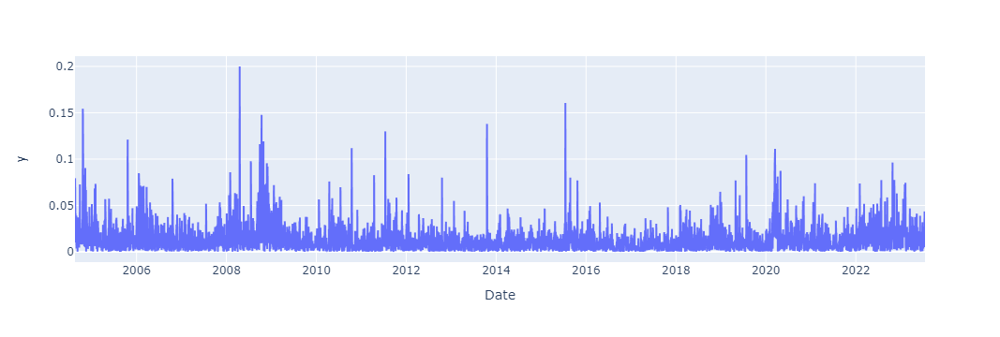

In [24]:
for i in tickers:
    stock_more_info(i)